In [1]:

import warnings
import numpy as np
# import pandas as pd
import scanpy as sc
import scipy
from featuremap import featuremap_

sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)

/Users/uqyyao4/opt/anaconda3/envs/featmap/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.4 numpy==1.23.5 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.4 louvain==0.8.0 pynndescent==0.5.11


# FeatureMAP on Pancreatic development data
1. GEX and GVA visualization
2. Gene variation trajectory and pseudotime
3. Core and transition states, leiden clustering implementation
4. DGV to indentify important genes
5. Gene contribution visualization


## Data loading


In [2]:

# # Datasets
# _datasets = {
#     "pancreas": ("https://figshare.com/ndownloader/files/25060877", (2531, 27998)),
#     "pancreas_preprocessed": ("https://figshare.com/ndownloader/files/25030028", (2531, 2000)),
#     "pancreas_preprocessed_vk": ("https://figshare.com/ndownloader/files/41325411", (2531, 5974)),
#     "lung": ("https://figshare.com/ndownloader/files/25038224", (24882, 24051)),
#     "reprogramming_morris": ("https://figshare.com/ndownloader/files/25503773", (104679, 22630)),
#     "zebrafish": ("https://figshare.com/ndownloader/files/27265280", (2434, 23974)),
#     "reprogramming_schiebinger": ("https://figshare.com/ndownloader/files/28618734", (236285, 19089)),
#     "reprogramming_schiebinger_serum_subset": ("https://figshare.com/ndownloader/files/35858033", (165892, 19089)),
#     "bone_marrow": ("https://figshare.com/ndownloader/files/35826944", (5780, 27876)),
# }

# import os
# dataset = 'lung'
# filepath = f'datasets/{dataset}.h5ad'
# # Check if the data is already downloaded
# if not os.path.exists(filepath):
#     print(f'Downloading {dataset} dataset...')
#     # Download the preprocessed pancreas dataset
#     adata = sc.read(filename=filepath, backup_url=_datasets[dataset][0])
# else:
#     adata = sc.read(filepath)

# # import scvelo as scv
# # scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000 )
    
# # Preprocessing
# sc.pp.filter_cells(adata, min_genes=100)
# sc.pp.filter_genes(adata, min_cells=3)
# # Normalizing to median total counts
# sc.pp.normalize_total(adata)
# # Logarithmize the data
# sc.pp.log1p(adata)
# # Highly variable genes
# sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# adata = adata[:, adata.var.highly_variable]

adata = sc.read('/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP_rev/data/CD8_exhaustion/CD8_exhaustion_cl13.h5ad')



## FeatureMAP GEX and GVA visualization

UMAP embedding.

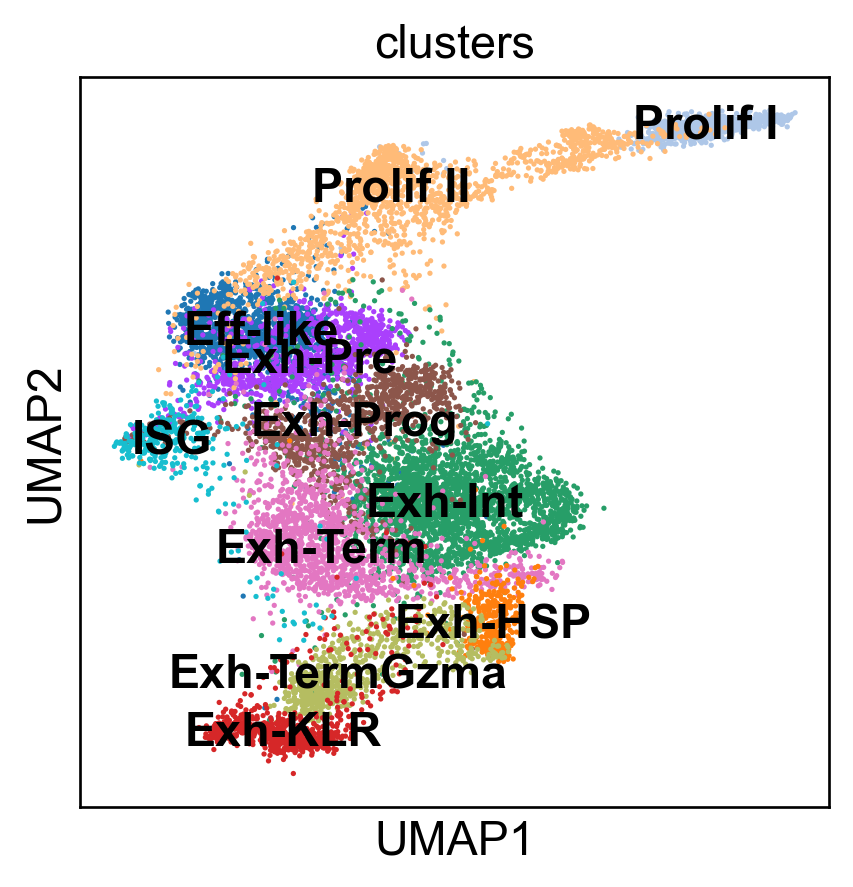

In [3]:
import umap
emb_umap = umap.UMAP().fit_transform(adata.X)
adata.obsm['X_umap'] = emb_umap
sc.pl.embedding(adata, basis='umap', color='clusters', legend_loc='on data')

### GEX embedding

In [5]:
 
import importlib
importlib.reload(featuremap_)

data = adata.X.copy()

emb_svd, vh = featuremap_._preprocess_data(data)

emb_featuremap = featuremap_.FeatureMAP(
                    random_state=42,
                    output_variation=False,
                    output_feat=True,
                    verbose=True,
                    ).fit(emb_svd)

Performing SVD decomposition on the data
SVD decomposition time is 145.92039227485657
FeatureMAP(output_feat=True, random_state=42, verbose=True)
Fri Jun  7 17:01:15 2024 Construct fuzzy simplicial set
Fri Jun  7 17:01:15 2024 Finding Nearest Neighbors
Fri Jun  7 17:01:15 2024 Building RP forest with 10 trees
Fri Jun  7 17:01:15 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Jun  7 17:01:15 2024 Finished Nearest Neighbor Search
Fri Jun  7 17:01:16 2024 Construct embedding
Fri Jun  7 17:01:17 2024 Computing tangent space
Fri Jun  7 17:01:30 2024 Local SVD time is 13.733972072601318
Fri Jun  7 17:01:35 2024 Computing diameter time is 4.767179727554321
Fri Jun  7 17:01:35 2024 Average over 12 times
Fri Jun  7 17:01:50 2024 Average time is 14.669321060180664
Fri Jun  7 17:01:51 2024 Tangent_space_approximation time is 33.949851751327515
Fri Jun  7 17:01:51 2024 Tangent space embedding
Fri Jun  7 17:02:

/Users/uqyyao4/opt/anaconda3/envs/featmap/lib/python3.9/site-packages/numba/core/decorators.py:250: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


Fri Jun  7 17:02:12 2024 Start optimizing layout


Epochs completed: 100%| ██████████ 400/400 [01:26]


Fri Jun  7 17:03:39 2024 Optimize layout time is 86.75088286399841
Fri Jun  7 17:03:39 2024 Computing expression embedding densities
Fri Jun  7 17:03:44 2024 Embedding radii computation time is 4.606324911117554
Fri Jun  7 17:03:44 2024 Finished embedding


/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP-1/featuremap/featuremap_.py:912: RuntimeWarning: invalid value encountered in sqrt
  featuremap_kwds["re_sum"] = np.sqrt(re_sum) # Variance of Gaussian distribution


mu is not added to adata


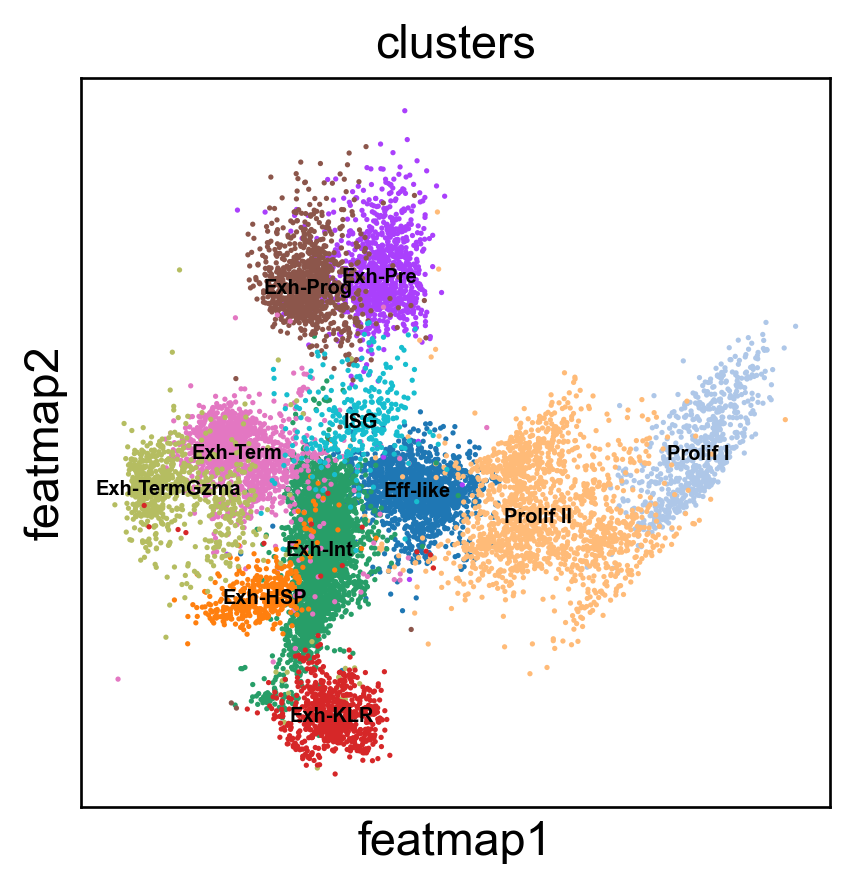

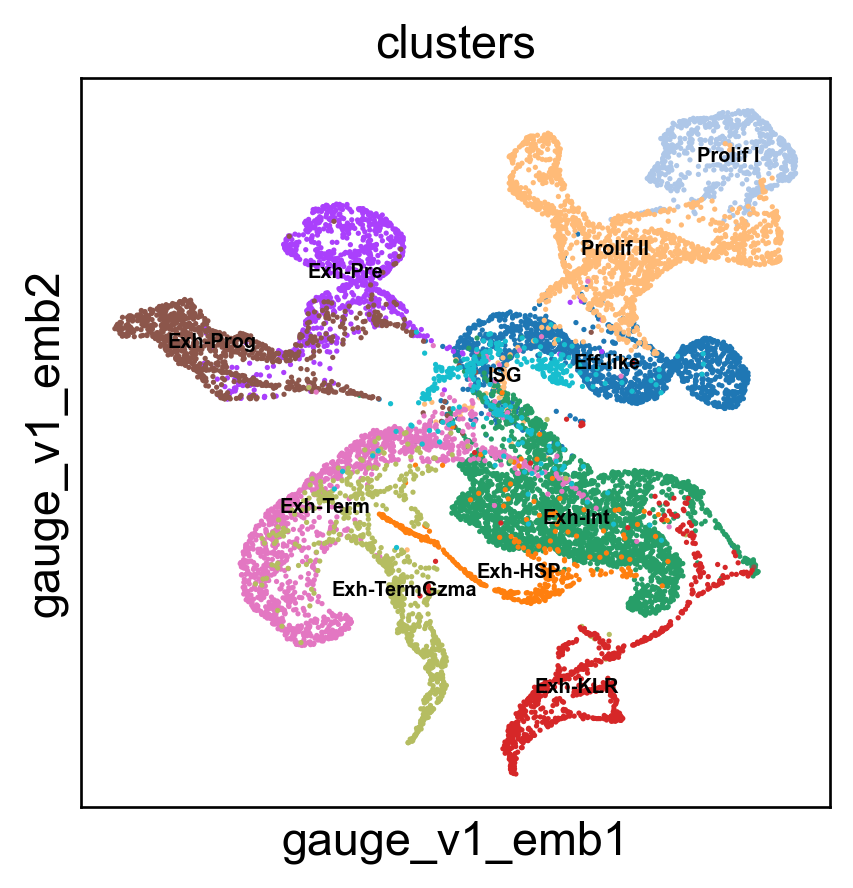

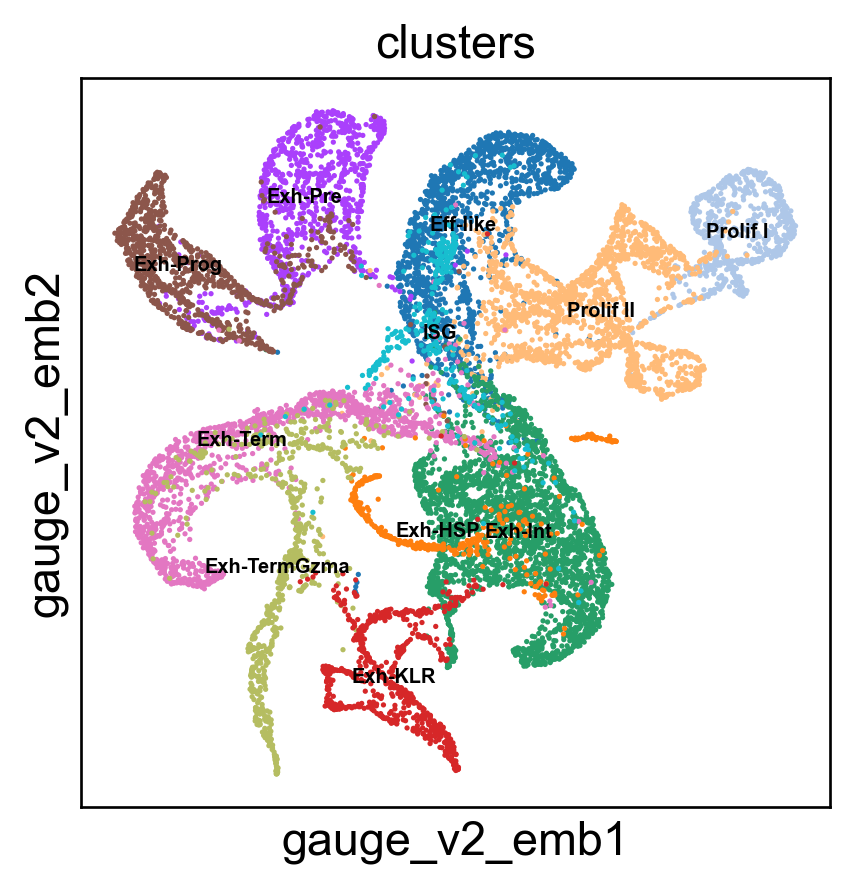

In [6]:
# create adata object
from featuremap import features
import importlib
importlib.reload(features)

adata = features.create_adata(X=adata.X, emb_featuremap=emb_featuremap, obs=adata.obs, var=adata.var)
adata.obsm['X_svd'] = emb_svd
adata.varm['svd_vh'] = vh.T
# adata.obsm['X_featmap'] = emb_featuremap.embedding_
# adata.obsm['gauge_v1_emb'] = emb_featuremap._featuremap_kwds['gauge_v1_emb']
# adata.obsm['gauge_v2_emb'] = emb_featuremap._featuremap_kwds['gauge_v2_emb']
# adata.obsm['vh_smoothed'] = emb_featuremap._featuremap_kwds['vh_smoothed']
# adata.obsm['Singular_value'] = emb_featuremap._featuremap_kwds['Singular_value']
# adata.varm['svd_vh'] = emb_featuremap._featuremap_kwds['svd_vh'].T
# adata.obsm['VH_embedding'] = emb_featuremap._featuremap_kwds['VH_embedding']

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v1_emb',legend_fontsize =6, s=10,legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v2_emb',legend_fontsize =6,s=10, legend_loc='on data', color=['clusters'])


### GVA embedding

In [7]:
# Variation embedding
import importlib
importlib.reload(featuremap_)

<module 'featuremap.featuremap_' from '/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP-1/featuremap/featuremap_.py'>

FeatureMAP(min_dist=0.3, output_variation=True, random_state=42, threshold=0.5, verbose=True)
Fri Jun  7 17:03:44 2024 Construct fuzzy simplicial set
Fri Jun  7 17:03:44 2024 Finding Nearest Neighbors
Fri Jun  7 17:03:44 2024 Building RP forest with 10 trees
Fri Jun  7 17:03:45 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Jun  7 17:03:45 2024 Finished Nearest Neighbor Search
Fri Jun  7 17:03:45 2024 Construct embedding
Fri Jun  7 17:03:46 2024 Computing tangent space
Fri Jun  7 17:03:57 2024 Local SVD time is 11.514187097549438
Fri Jun  7 17:04:02 2024 Computing diameter time is 4.7318010330200195
Fri Jun  7 17:04:02 2024 Average over 12 times
Fri Jun  7 17:04:17 2024 Average time is 14.36789584159851
Fri Jun  7 17:04:17 2024 Tangent_space_approximation time is 31.281553030014038
k is 1
Fri Jun  7 17:04:27 2024 Variation_embedding time is 9.865979194641113
Fri Jun  7 17:04:27 2024 Finished embedd

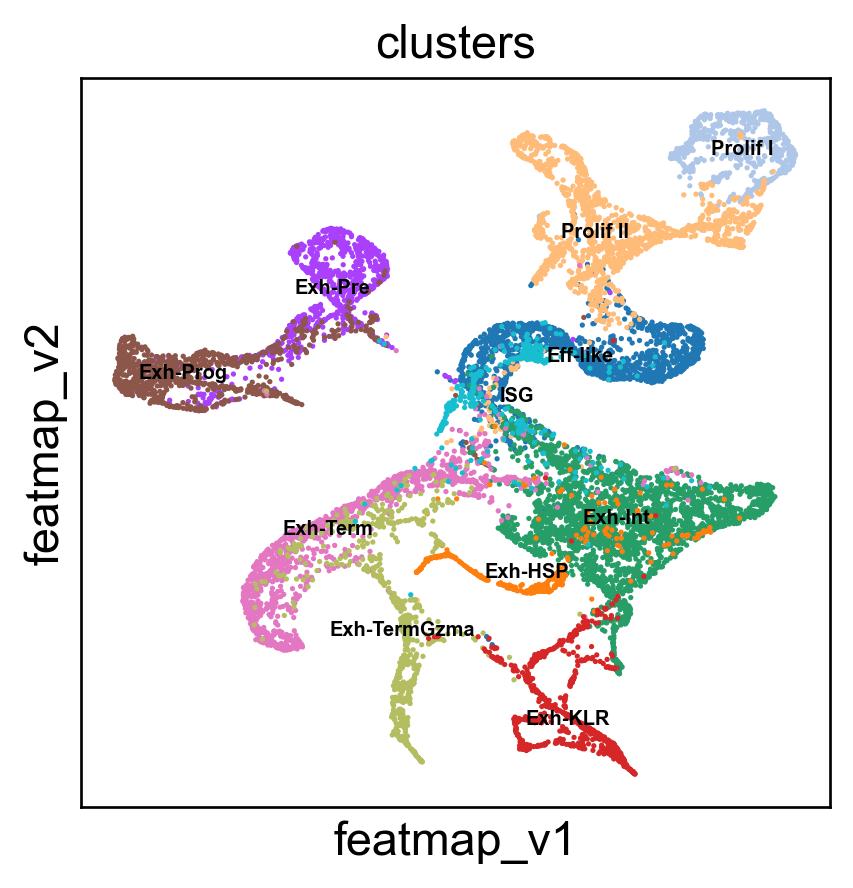

In [8]:

emb_featuremap = featuremap_.FeatureMAP(random_state=42,output_variation=True,threshold=0.5, min_dist=0.3, verbose=True).fit(emb_svd)

adata.obsm['X_featmap_v'] = emb_featuremap.embedding_
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

adata.obsm['variation_pc'] = emb_featuremap._featuremap_kwds['variation_pc']


3D embedding

In [9]:
data = adata.X.copy()
from featuremap import featuremap_
emb_featuremap_3d = featuremap_.FeatureMAP(n_components=3,random_state=42,output_variation=True, verbose=True).fit_transform(emb_svd)

adata.obsm['X_featmap_v_3d'] = emb_featuremap_3d


FeatureMAP(n_components=3, output_variation=True, random_state=42, verbose=True)
Fri Jun  7 17:04:28 2024 Construct fuzzy simplicial set
Fri Jun  7 17:04:28 2024 Finding Nearest Neighbors
Fri Jun  7 17:04:28 2024 Building RP forest with 10 trees
Fri Jun  7 17:04:28 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Jun  7 17:04:29 2024 Finished Nearest Neighbor Search
Fri Jun  7 17:04:29 2024 Construct embedding
Fri Jun  7 17:04:29 2024 Computing tangent space
Fri Jun  7 17:04:40 2024 Local SVD time is 10.563226222991943
Fri Jun  7 17:04:45 2024 Computing diameter time is 4.535239934921265
Fri Jun  7 17:04:45 2024 Average over 12 times
Fri Jun  7 17:04:59 2024 Average time is 14.205986976623535
Fri Jun  7 17:04:59 2024 Tangent_space_approximation time is 30.05585527420044
k is 13
Fri Jun  7 17:05:11 2024 Variation_embedding time is 12.024394989013672
Fri Jun  7 17:05:11 2024 Finished embedding


In [10]:



from featuremap import features
import importlib
importlib.reload(features)

features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'])

Pseudotime.

In [130]:
# FeatureMAP pseudo-time
from featuremap import features
import importlib
importlib.reload(features)

# Starting point index
# Randomly select a starting point from cluster "Ng3 low EP"
start_point_index = np.where(adata.obs['clusters'] == 'Ngn3 low EP')[0][0]
features.pseudotime_mst(adata, random_state=42, start_point_index=start_point_index)

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, color=['feat_pseudotime'])

IndexError: index 0 is out of bounds for axis 0 with size 0

## Core and transition states

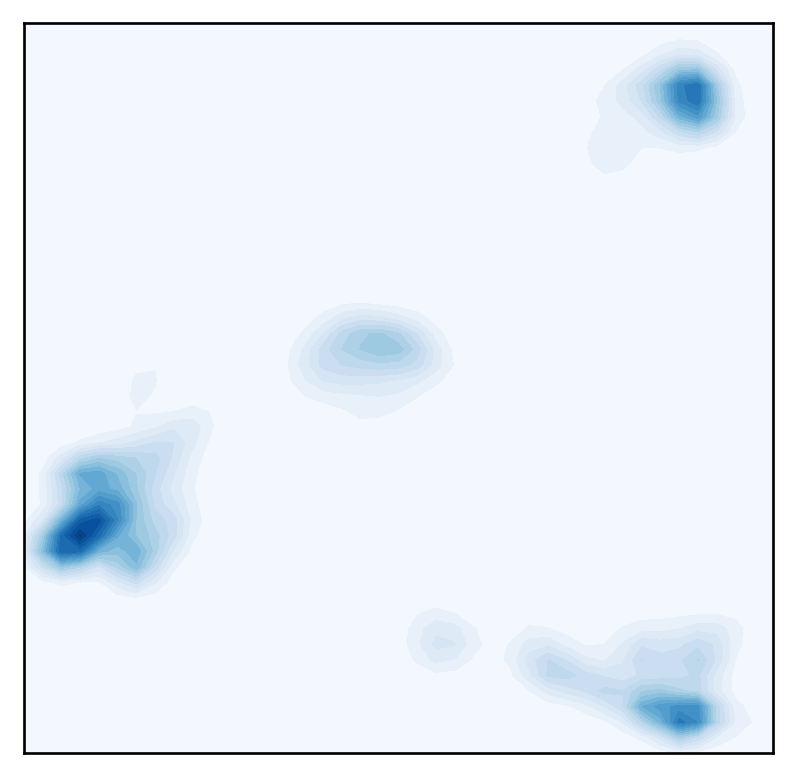

<Figure size 480x480 with 0 Axes>

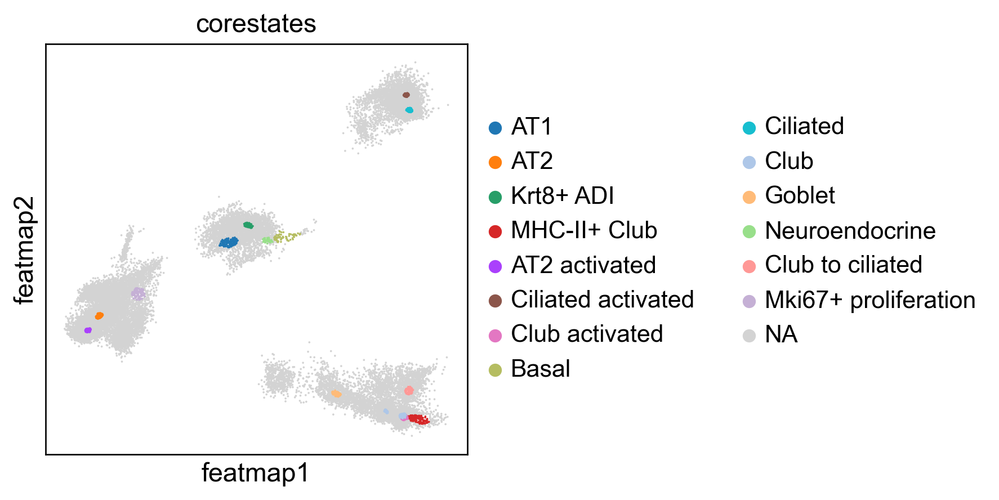

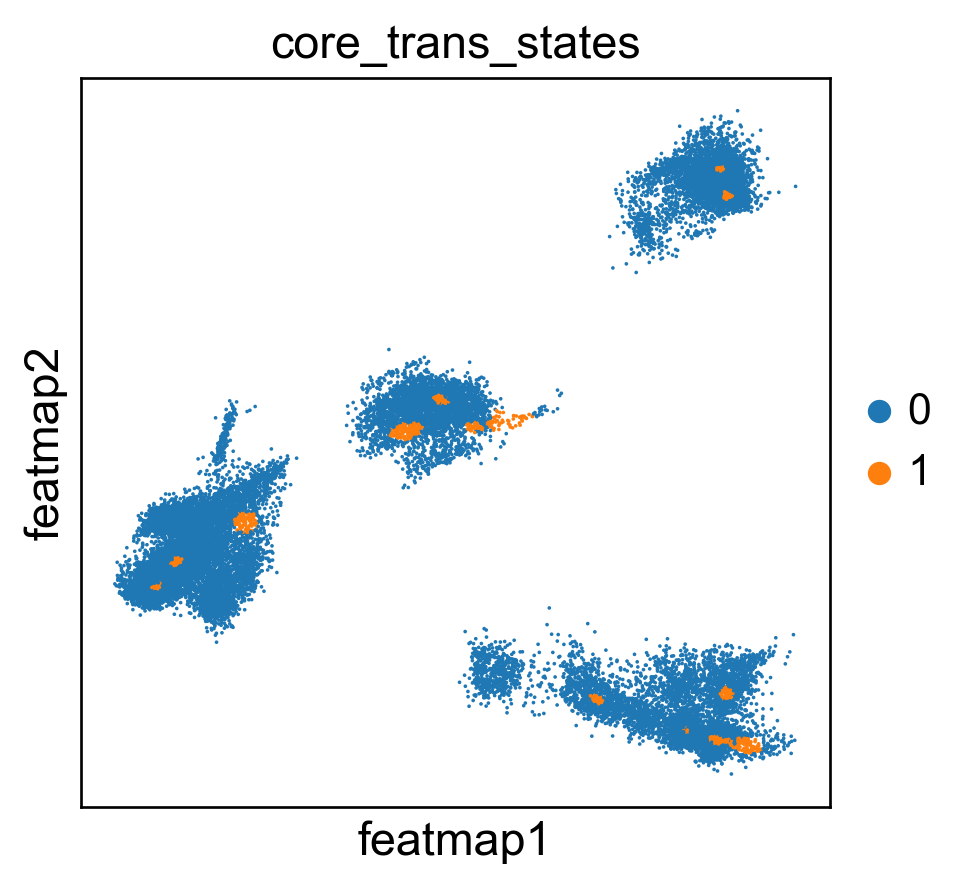

In [131]:
# Contour plot to show the density

from featuremap import core_transition_state
import importlib
importlib.reload(core_transition_state)

# Plot the density 
core_transition_state.plot_density(adata)

# Compute core-states based on clusters
core_transition_state.core_transition_state(adata)

Project core and transition states to GVA embedding.

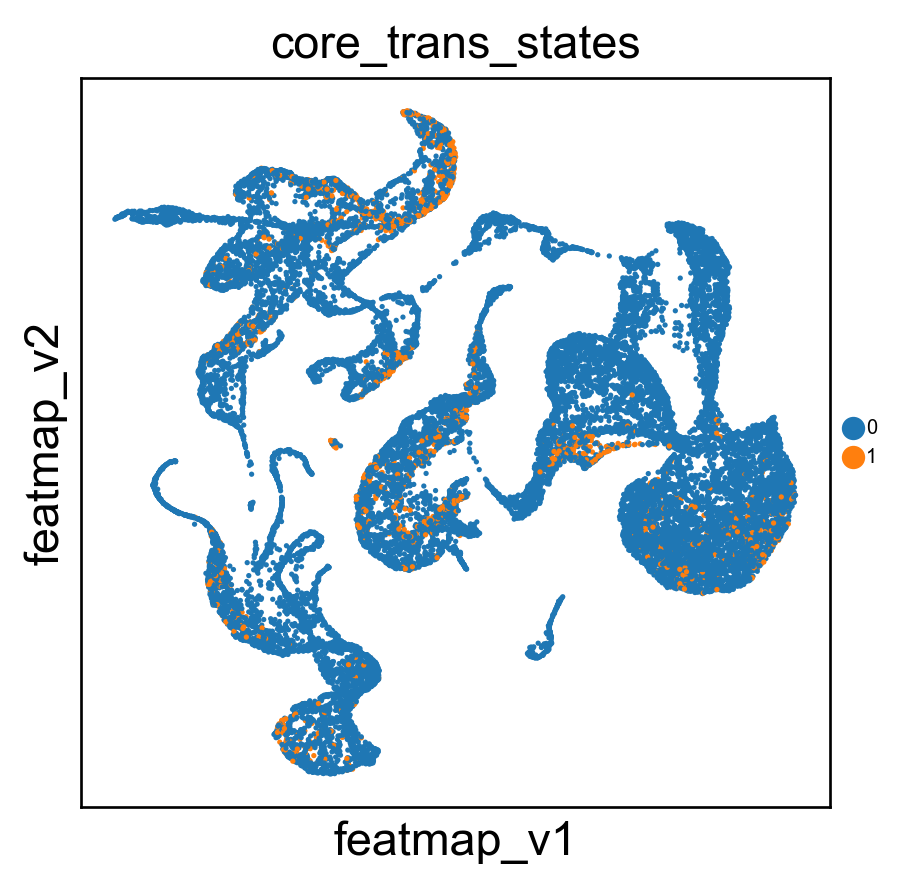

In [132]:
# plot core/transition states on variation embedding
sc.pl.embedding(adata, 'featmap_v',legend_fontsize =6, s=10, color=['core_trans_states'])

In [133]:
adata

AnnData object with n_obs × n_vars = 24882 × 2000
    obs: 'initial_size', 'percent_mito', 'identifier', 'name', 'louvain', 'batch', 'day', 'clusters_coarse', 'clusters', 'early_vs_late', 'n_genes', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states'
    var: 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable', 'n_cells', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    varm: 'svd_vh'

In [134]:
emb_featuremap_3d = adata.obsm['X_featmap_v_3d']
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['core_trans_states'], marker_size=1)

In [135]:
adata

AnnData object with n_obs × n_vars = 24882 × 2000
    obs: 'initial_size', 'percent_mito', 'identifier', 'name', 'louvain', 'batch', 'day', 'clusters_coarse', 'clusters', 'early_vs_late', 'n_genes', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states'
    var: 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable', 'n_cells', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    varm: 'svd_vh'

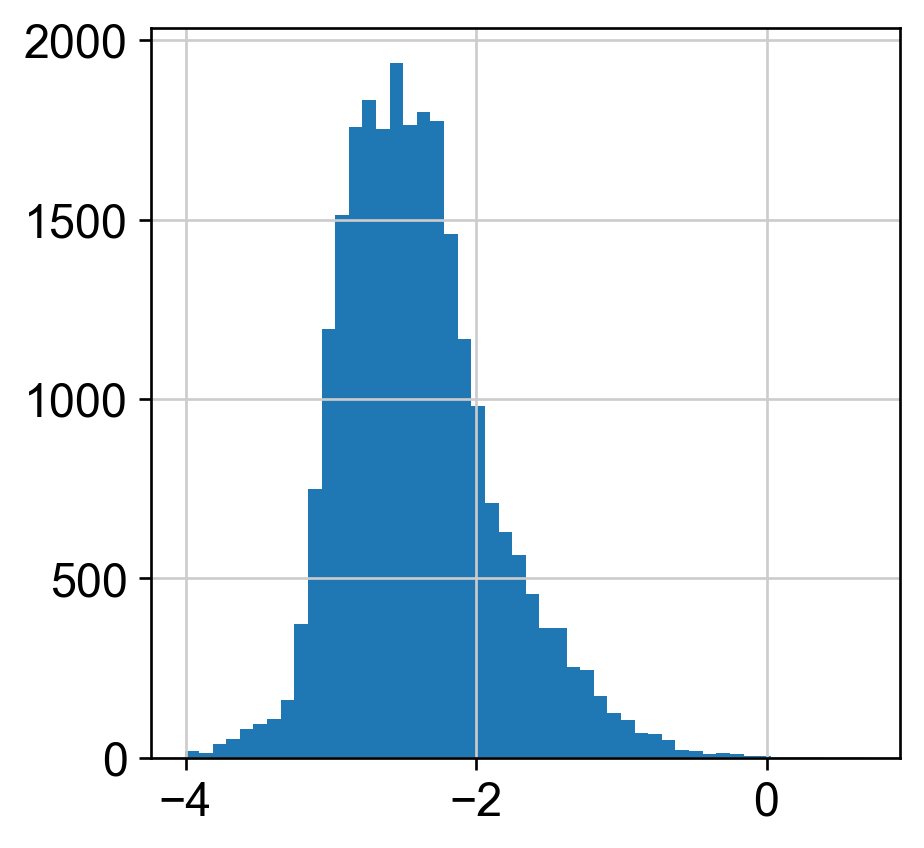

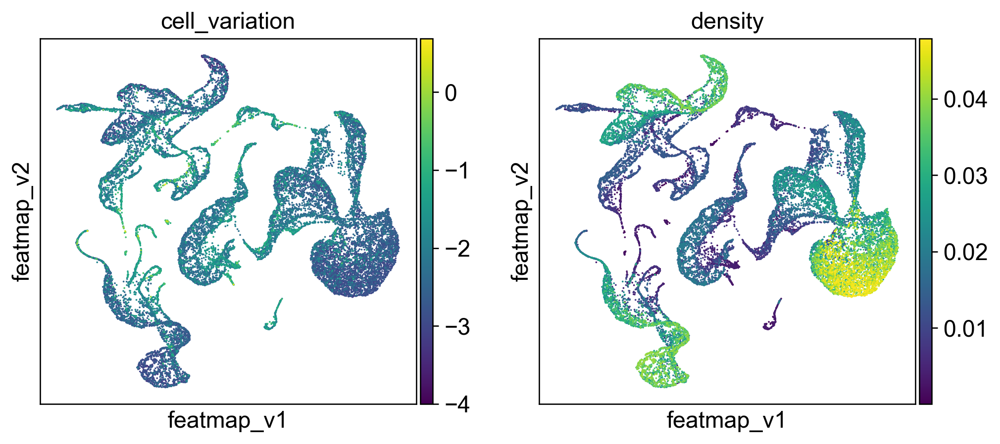

In [136]:
"""
Cell variation
"""
#######################################################
# use singular values to represent the variation
############################################################
# singular_val = emb_featuremap._featuremap_kwds['Singular_value']
# singular_val = emb_featuremap._featuremap_kwds['R']
singular_val = adata.obsm['re_sum_without_log']

# norm of the top k singular values
k=10
singular_val_norm = np.linalg.norm(singular_val[:,:k], axis=1)
singular_val_norm = np.log(singular_val_norm)
# plt.hist(singular_val_norm, bins=50)
import matplotlib.pyplot as plt
plt.hist(singular_val_norm, bins=50)

adata.obs['cell_variation'] = singular_val_norm
sc.pl.embedding(adata, 'featmap_v', legend_loc='on data' , legend_fontsize=10,color=['cell_variation', 'density',])

In [137]:

############################################
# Density vs pseudotime
############################################
#%%
def plot_density_pseudotime(filtered_data, pseudotime='feat_pseudotime', clusters='clusters', density='density'):
    from pygam import LinearGAM
    import seaborn as sns
    import matplotlib.pyplot as plt

    X = filtered_data[pseudotime].values
    y = filtered_data[density].values
    gam = LinearGAM(n_splines=20).fit(X, y)
    
    fig, ax = plt.subplots()
    XX = gam.generate_X_grid(term=0, n=100)
   
    for response in gam.sample(X, y, quantity='y', n_draws=50, sample_at_X=XX):
        plt.scatter(XX, response, alpha=.01, color='k')
    plt.plot(XX, gam.predict(XX), 'r--')
    plt.plot(XX, gam.prediction_intervals(XX, width=.95), color='b', ls='--')

    ax.plot(XX, gam.predict(XX), 'b--', label='_nolegend_')
    sns.scatterplot(x=pseudotime, y=density, data=filtered_data, hue=clusters, ax=ax)
    

    ax.set_xlabel(pseudotime)
    # ax.set_ylabel('')
    ax.set_ylabel(density)
    ax.legend().remove()
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    # plt.savefig(f'./figures/pancreas/density_pseudotime_{pseudotime}_beta.png', bbox_inches='tight')
    plt.show()


In [138]:
adata

AnnData object with n_obs × n_vars = 24882 × 2000
    obs: 'initial_size', 'percent_mito', 'identifier', 'name', 'louvain', 'batch', 'day', 'clusters_coarse', 'clusters', 'early_vs_late', 'n_genes', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states', 'cell_variation'
    var: 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable', 'n_cells', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    varm: 'svd_vh'

In [139]:
#%%
# Filter cells based on clusters

selected_clusters = ['Ngn3 low EP', 'Ngn3 high EP', 'Fev+', 'Alpha']
# selected_clusters = ['Ngn3 low EP', 'Ngn3 high EP', 'Fev+', 'Beta']
# selected_clusters = ['Fev+', 'Beta']
# selected_clusters = ['Fev+', 'Alpha']


# selected_clusters = ['Exh-Int', 'Exh-KLR']
# selected_clusters = ['Fev+', 'Alpha']
filtered_data = adata.obs[adata.obs['clusters'].isin(selected_clusters)]
# downsample the data to 350 cells
# filtered_data = filtered_data.sample(n=350, random_state=42)
# Filter data with density larger than 0.02
# filtered_data = filtered_data[filtered_data['density'] > 0.03]
#%%
# Denstiy vs pseudotime
# pseudotime_list = ['feat_pseudotime','dpt_pseudotime', 'palantir_pseudotime', 'slingshot_pseudotime', 'monocle2_pseudotime', 
                #    'monocle3_pseudotime',  'scFate_pseudotime', 'via_pseudotime']
# for pseudotime in pseudotime_list:
plot_density_pseudotime(filtered_data, pseudotime='feat_pseudotime', density='density', clusters='clusters')

KeyError: 'feat_pseudotime'

Leiden clustering to refine the core and transition states.

In [ ]:
import anndata as ad
adata_var = ad.AnnData(X=adata.obsm['variation_pc'], obs=adata.obs)
adata_var.obsm['X_featmap_v'] = adata.obsm['X_featmap_v']
adata_var.obs['clusters'] = adata.obs['clusters']

# leiiden clustering on variation embedding
sc.pp.pca(adata_var)
sc.pp.neighbors(adata_var, n_neighbors=5,)
sc.tl.leiden(adata_var, resolution=0.5)

adata.obs['leiden_v'] = adata_var.obs['leiden']


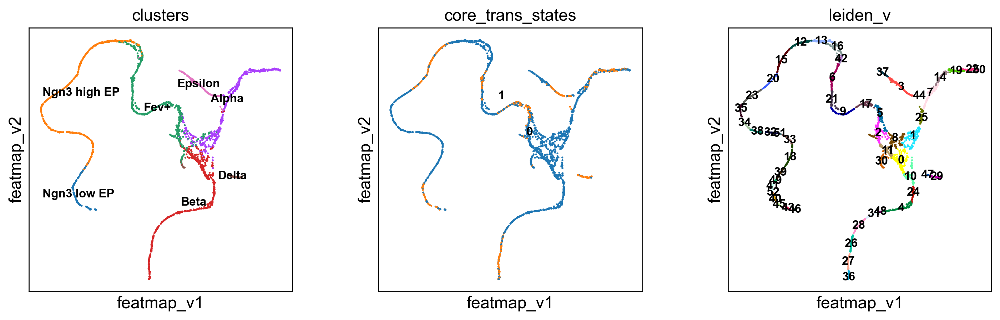

In [ ]:
#  plot the density
sc.settings.set_figure_params(dpi=120)

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','core_trans_states', 'leiden_v'])

In [ ]:
import importlib
importlib.reload(features)

# features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'], marker_size=3)
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['leiden_v'], symbol=adata.obs['clusters'], marker_size=1)

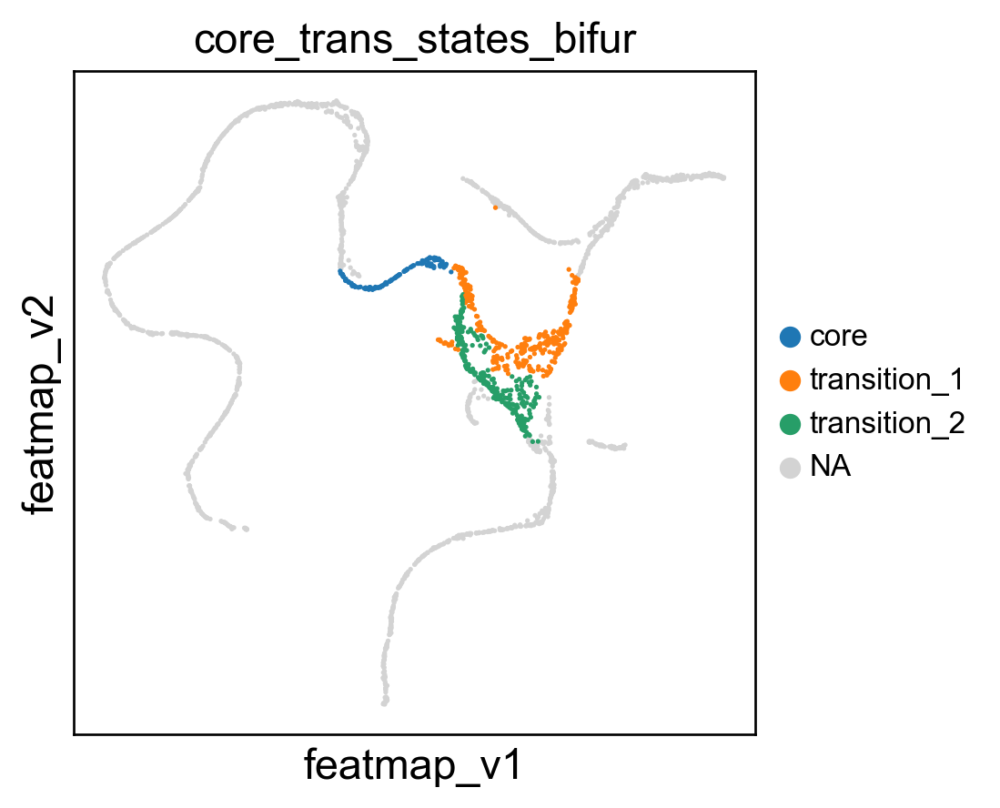

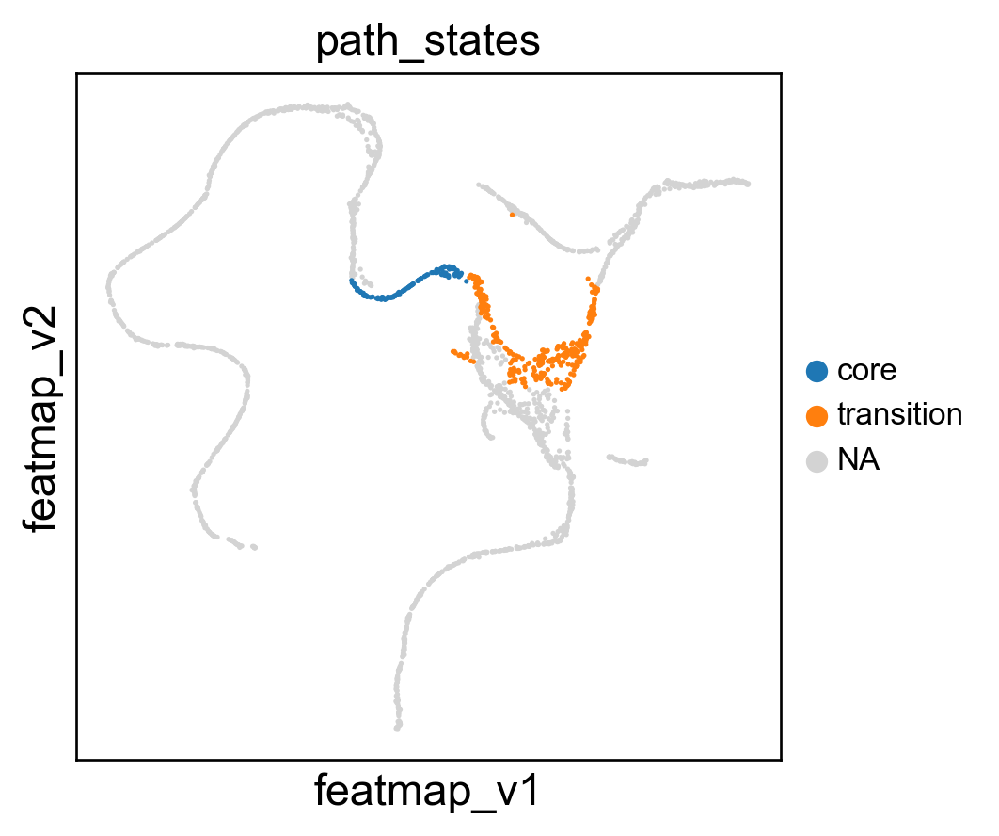

In [ ]:

# During the bifurcation, select the core states and transition states by leiiden clustering
core_states = [9,17,]
transition_states_1 = [5, 8,1,25]
transition_states_2 = [2,11,0]


from featuremap import core_transition_state
import importlib
importlib.reload(core_transition_state)

core_transition_state.bifurcation_plot(adata, core_states, transition_states_1, transition_states_2)
core_transition_state.path_plot(adata, core_states, transition_states_1)




T-test p-value for core states and transition states_1: 0.09251871427513568


Text(0.5, 1.0, 'T-test p-value is 9.252e-02')

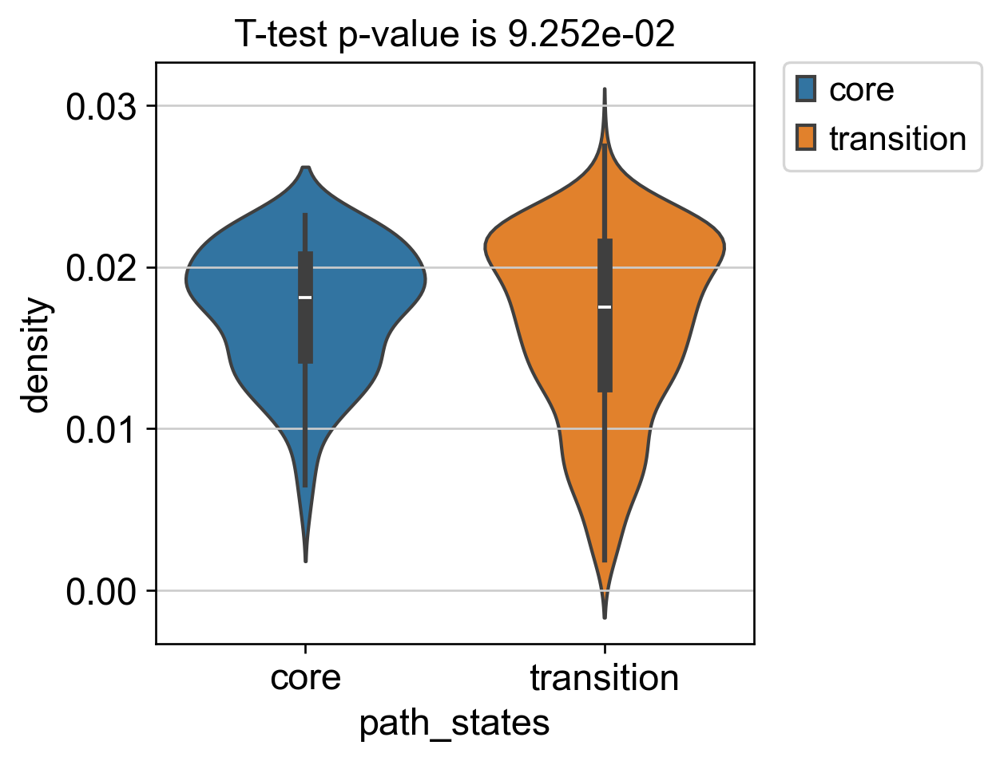

In [ ]:
# violin plot to show the density of core states and transition states
from scipy import stats
# t-test for the density of core states and transition states_1
p_val = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['density'],
                adata.obs[adata.obs['path_states']=='transition']['density'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val}')

# plot the p_value in the violin plot
import seaborn as sns
import matplotlib.pyplot as plt
sns.violinplot(x ='path_states', y ='density', data = adata.obs, hue='path_states')
# legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# p_value with exponential base 10

plt.title( 'T-test p-value is ' + "{0:.{1}e}".format(p_val, 3))


Differential Gene Variation Analysis

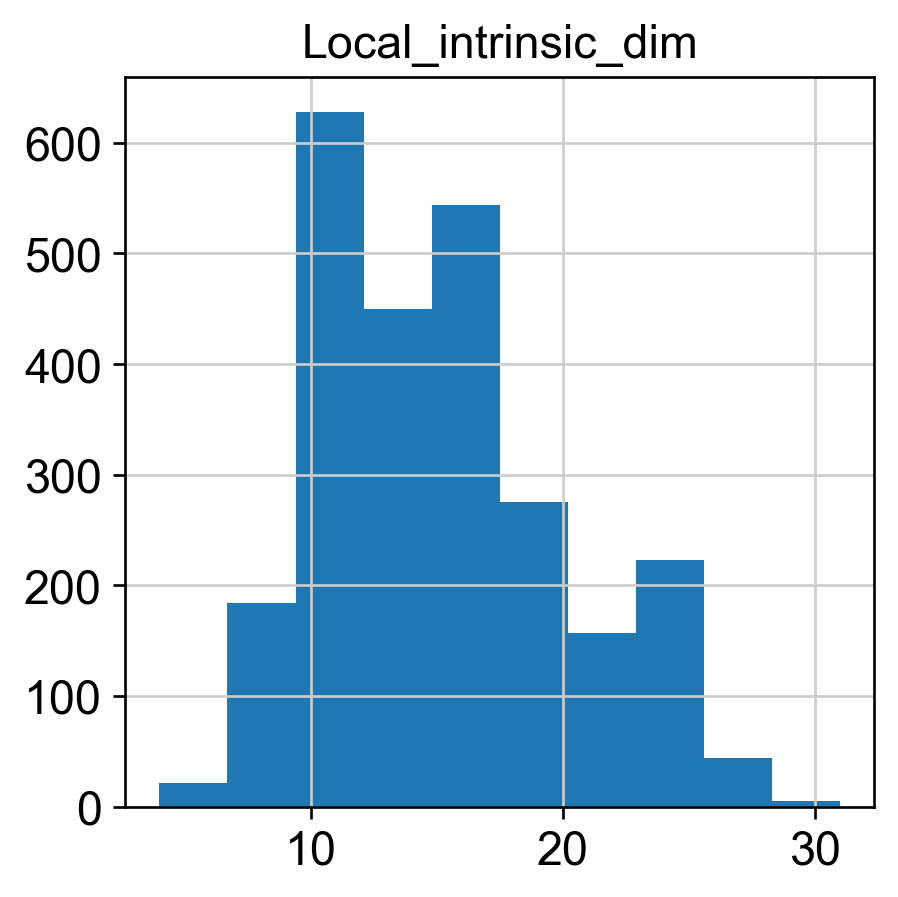

k is 14
Start matrix multiplication
Finish matrix multiplication in 4.78039288520813
Finish norm calculation in 0.07889318466186523


<Figure size 480x480 with 0 Axes>

In [ ]:
importlib.reload(featuremap_)
from featuremap.features import feature_variation, feature_variation_embedding
feature_variation(adata, threshold=0.9)

def variation_feature_pp(adata):
    import anndata as ad
    layer = 'variation_feature'
    adata_var = ad.AnnData(X=adata.layers[layer].copy(), )
    adata_var.obs = adata.obs.copy()
    adata_var.var = adata.var.copy()
    adata_var.layers['counts'] = adata.X.copy() 
    
    adata_var.X[np.isnan(adata_var.X)]=0

    adata_var.obs_names = adata.obs_names
    adata_var.var_names = adata.var_names
    adata_var.obs['clusters'] = adata.obs['clusters'].copy()
    adata_var.layers['counts'] = adata.X.copy()

    # Normalization
    sc.pp.normalize_total(adata_var, target_sum=1e4 )
    sc.pp.log1p(adata_var, )

    # Filtering variation for DGV 
    adata_var.layers['var_filter'] = adata_var.X.copy()
    # Filter low variation
    idx = adata_var.layers['var_filter'] < np.max(adata_var.layers['var_filter']) * 0.2
    # idx = adata_var.layers['var_filter'] < np.quantile(adata_var.layers['var_filter'], 0.2)
    # print(f'Low var ratio is {np.sum(idx) / (idx.shape[0]*idx.shape[1])}')
    adata_var.layers['var_filter'][idx] = 0

    # Filter variation by low count
    if isinstance(adata.X, np.ndarray):
        idx = adata.X < np.max(adata.X) * 0.2
    else:
        idx = adata.X.toarray() < np.max(adata.X.toarray()) * 0.2

    # idx = adata.X.toarray() < np.quantile(adata.X.toarray()[np.nonzero(adata.X.toarray())], 0.2)
    # idx = adata.X < np.max(adata.X) * 0.2
    # print(f'Low var ratio by expression is {np.sum(idx) / (idx.shape[0]*idx.shape[1])}')
    adata_var.layers['var_filter'][idx] = 0
    # Normalization
    sc.pp.normalize_total(adata_var, target_sum=1e4, layer='var_filter' )
    sc.pp.log1p(adata_var, layer='var_filter')

    return adata_var

adata_var = variation_feature_pp(adata)

adata.layers['variation_feature_processed'] = adata_var.layers['var_filter'].copy()


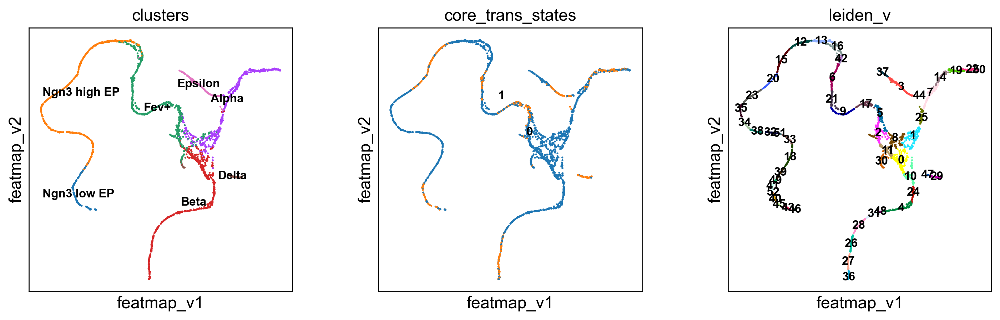

In [ ]:
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','core_trans_states', 'leiden_v'])

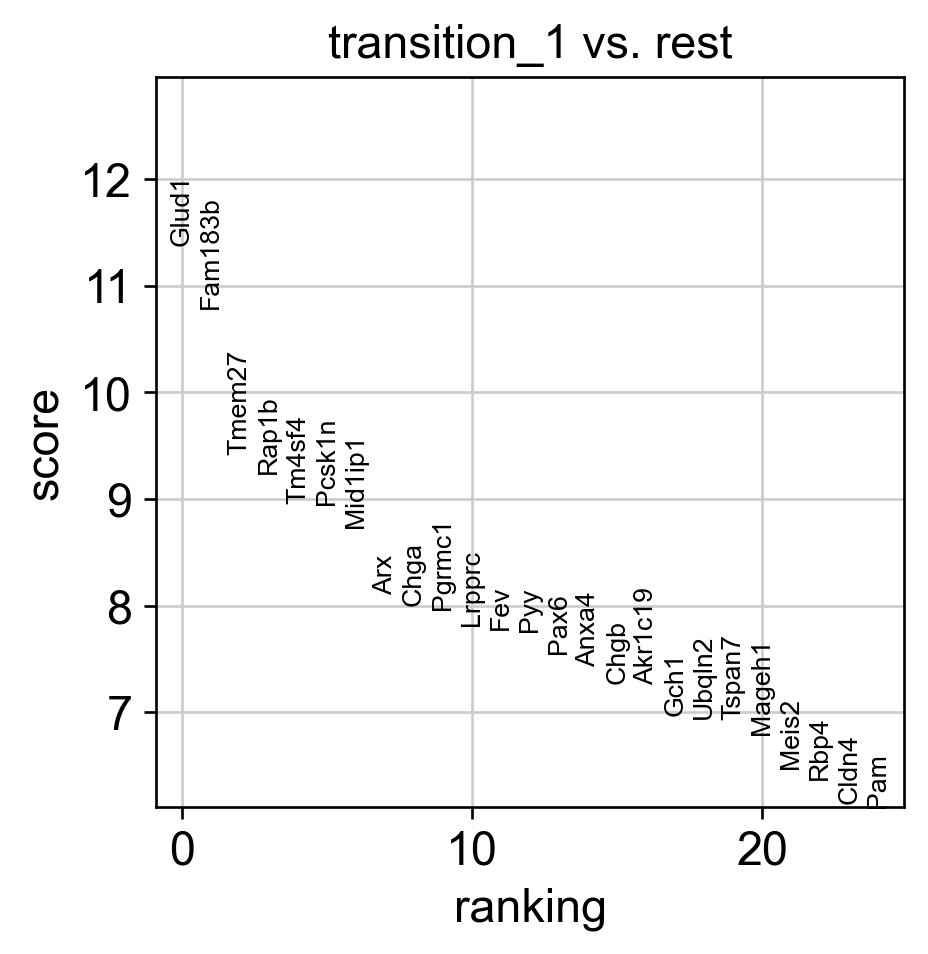

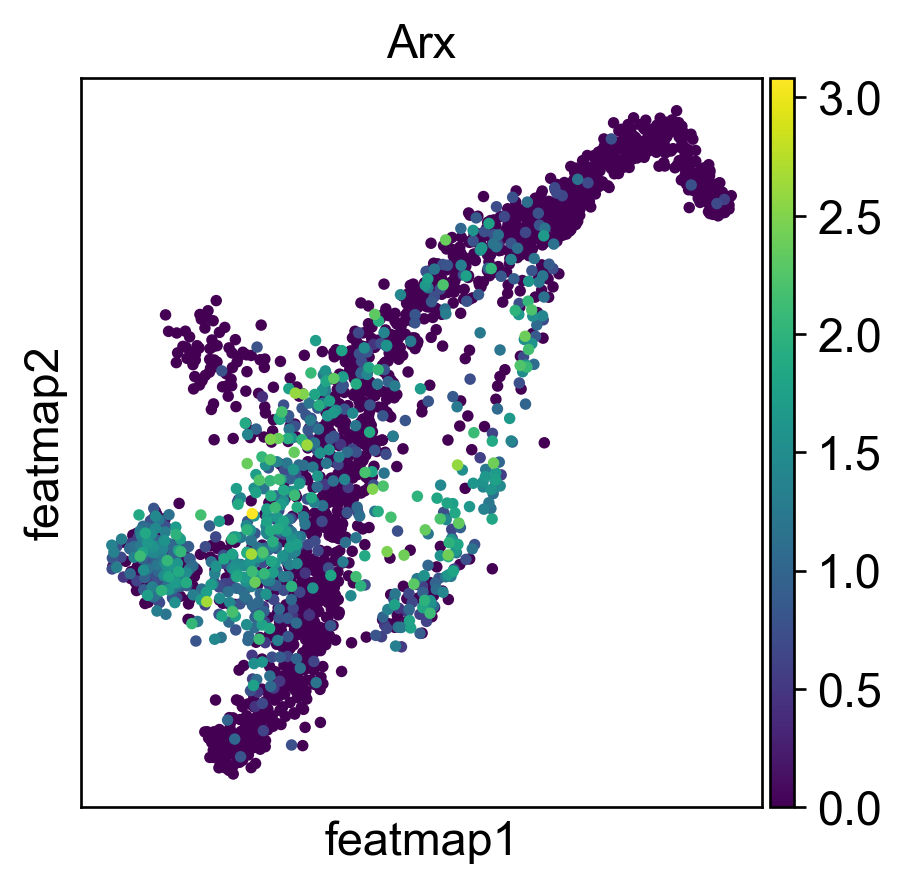

Rank of Arx is  [7] in transition_1
Start matrix multiplication
Finish matrix multiplication in 0.015948772430419922


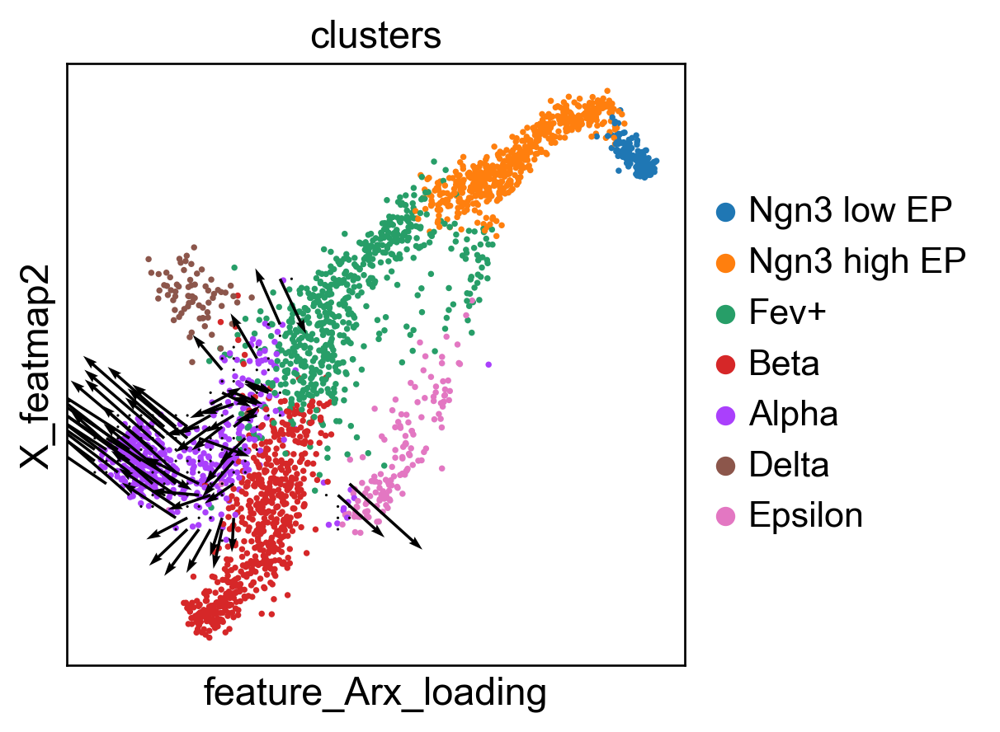

<Figure size 480x480 with 0 Axes>

In [ ]:
import importlib
importlib.reload(features)

sc.tl.rank_genes_groups(adata_var, 'core_trans_states_bifur', groups=['transition_1'],  method='wilcoxon', use_raw=False, layer='var_filter')
sc.pl.rank_genes_groups(adata_var, n_genes=25, sharey=False)
# Top 5 genes in rank_genes_groups
top_genes = adata_var.uns['rank_genes_groups']['names']['transition_1'][:5]


gene = 'Arx'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
rank = np.where(adata_var.uns['rank_genes_groups']['names']['transition_1'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition_1')

features.feature_projection(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.1, density=1, embedding='X_featmap',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Alpha']
                               )    


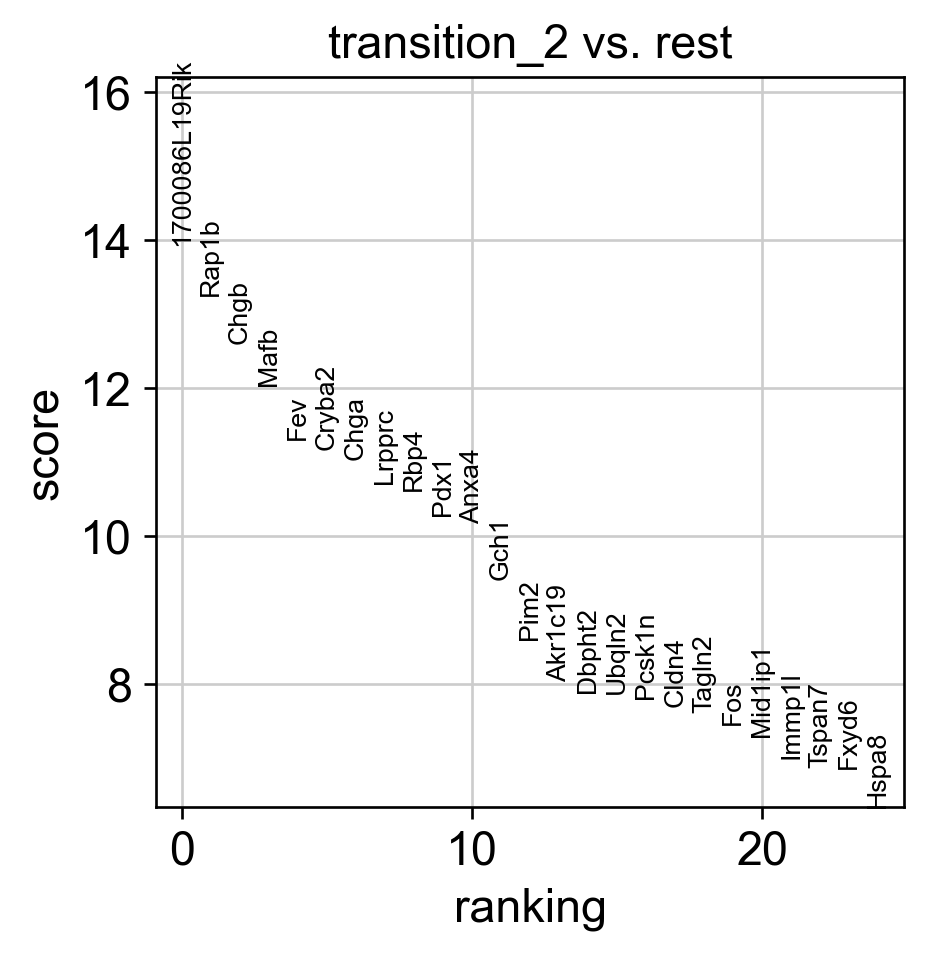

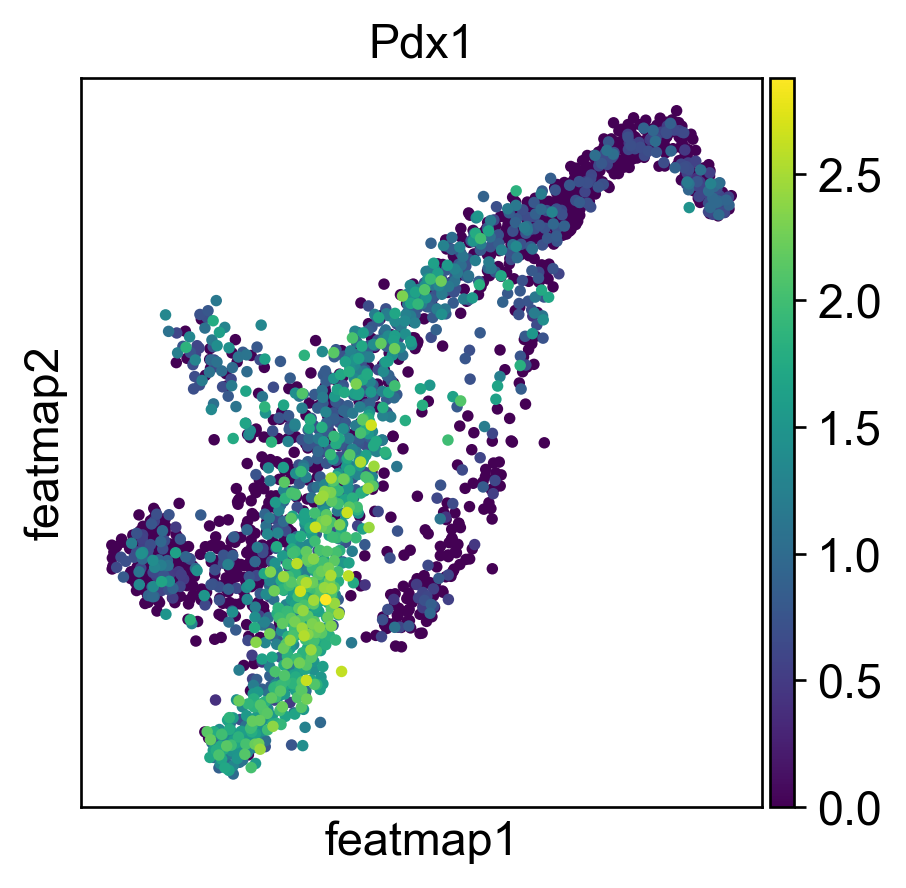

Rank of Pdx1 is  [9] in transition_2
Start matrix multiplication
Finish matrix multiplication in 0.017406940460205078


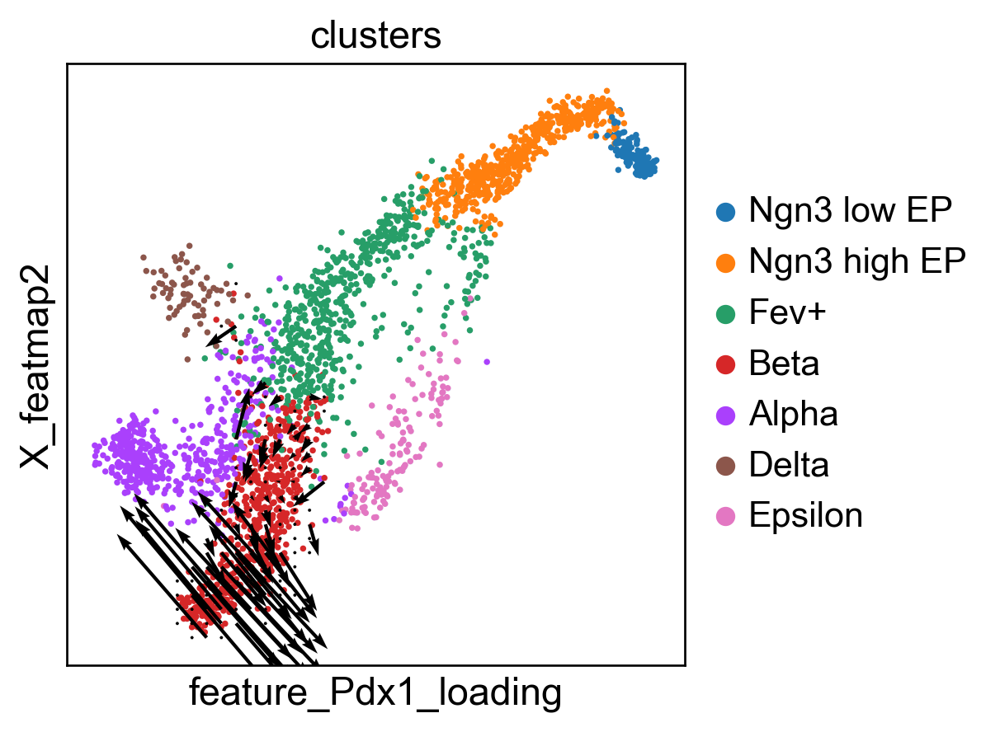

<Figure size 480x480 with 0 Axes>

In [ ]:
sc.tl.rank_genes_groups(adata_var, 'core_trans_states_bifur', groups=['transition_2'],  method='wilcoxon', use_raw=False, layer='var_filter')
sc.pl.rank_genes_groups(adata_var, n_genes=25, sharey=False)
# Top 5 genes in rank_genes_groups
top_genes = adata_var.uns['rank_genes_groups']['names']['transition_2'][:5]

gene = 'Pdx1'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
rank = np.where(adata_var.uns['rank_genes_groups']['names']['transition_2'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition_2')

features.feature_projection(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.1, density=0.8, embedding='X_featmap',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Beta',]
                               )    




Start matrix multiplication
Finish matrix multiplication in 0.0195920467376709
Finish kernel_density_estimate_anisotropic in 0.09122586250305176


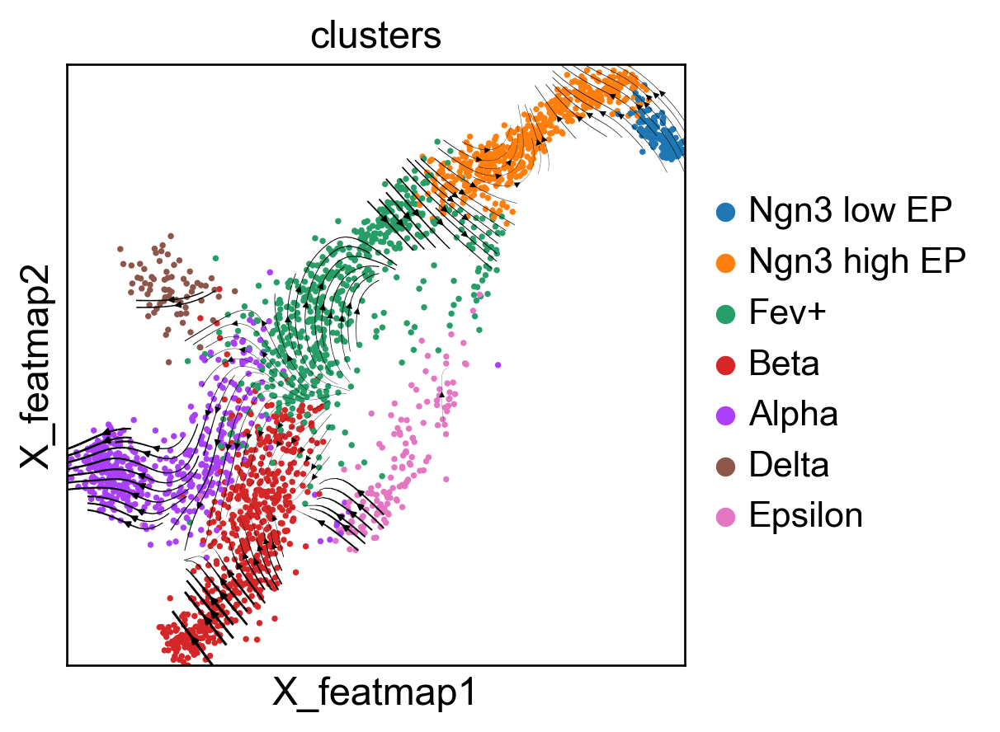

<Figure size 480x480 with 0 Axes>

In [ ]:
import importlib
importlib.reload(features)
gene = 'Pdx1'
features.feature_projection(adata, feature=gene)
features.plot_feature_field_stream(adata, feature=gene, )

In [ ]:
adata


AnnData object with n_obs × n_vars = 2531 × 2000
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime', 'n_genes', 'feat_pseudotime', 'density', 'density_separate_cluster', 'corestates', 'corestates_largest', 'corestates_binary', 'corestates_points', 'core_trans_states', 'cell_variation', 'leiden_v', 'core_trans_states_bifur', 'path_states', 'intrinsic_dim'
    var: 'highly_variable_genes', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'corestates_colors', 'core_trans_states_colors', 'leiden_v_colors', 'core_trans_states_bifur_colors', 'path_states_colors'
    obsm: 'X_featmap', '_knn_indices', 'U', 'Singular_value', 'VH', 'vh_smoothed', 'gauge_v1_emb', 'gauge_v2_emb', 'VH_embedding', 'R', 'mu_sum', 're_sum', 're_sum_without_log', 'emb_knn_indices', 'X_embedding', 'X_featmap_v', 'variation_pc', 'X_featmap_v_3d'
    var

In [ ]:
# from featuremap import features

# import importlib
# importlib.reload(features)
# top_genes =  adata_var.uns['rank_genes_groups']['names']['transition'][:10]
# feature = top_genes
# for f in feature:
#     print(f'Plotting {f}...')
#     features.feature_projection(adata, feature=f)
#     features.plot_one_feature(adata, feature=f, ratio=0.1, density=1, embedding='X_featmap',
#                                pseudotime='feat_pseudotime', pseudotime_adjusted=False, 
#                             #    plot_within_cluster=['Delta', ]
#                                )    


In [ ]:

# import importlib
# importlib.reload(features)

# features.plot_gauge_both(adata)